In [1]:
import numpy as np
from matplotlib import pyplot as plt
import pickle
import glob
from feature import Feature
from image import Data
from model import LeaveOneOutModel, TrainValTestModel
from preprocess import Preprocess
from visualize import Visualize
import pandas as pd
import seaborn as sn
%matplotlib inline

## training data(one leave out): X_april4, X_april5, X_april7, X_july8
## test data: X_april13

In [2]:
image_path_list = ['C:/dissertation/dataset/photos_April4_location1/photo_object*',
                   'C:/dissertation/dataset/photos_April4_location2/photo_object*',
                   'C:/dissertation/dataset/photos_April5_location1/photo_object*',
                   'C:/dissertation/dataset/photos_April5_location2/photo_object*',
                   'C:/dissertation/dataset/photos_April5_location3/photo_object*',
                   'C:/dissertation/dataset/photos_April5_location4/photo_object*',
                   'C:/dissertation/dataset/photos_April7_location1/photo_object*',
                   'C:/dissertation/dataset/photos_April7_location2/photo_object*',
                   'C:/dissertation/dataset/photos_April7_location3/photo_object*',
                   'C:/dissertation/dataset/photos_April7_location4/photo_object*',
                   'C:/dissertation/dataset/photos_April13/photo_object*']
label_path_list = ['C:/dissertation/dataset/labels_photos_April04.csv',
                   'C:/dissertation/dataset/labels_photos_April04.csv',
                   'C:/dissertation/dataset/labels_photos_April05.csv',
                   'C:/dissertation/dataset/labels_photos_April05.csv',
                   'C:/dissertation/dataset/labels_photos_April05.csv',
                   'C:/dissertation/dataset/labels_photos_April05.csv',
                   'C:/dissertation/dataset/labels_photos_April07.csv',
                   'C:/dissertation/dataset/labels_photos_April07.csv',
                   'C:/dissertation/dataset/labels_photos_April07.csv',
                   'C:/dissertation/dataset/labels_photos_April07.csv',
                   'C:/dissertation/dataset/labels_photos_April13.csv']
del_num_list = [6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6]
ignore_area_list = [None, None, None, None, None, None, None, None, None, None, [100, 150]]

In [3]:
candidates = []
for i in range(len(del_num_list)):
# for i in range(2):
    image_path = image_path_list[i]
    label_path = label_path_list[i]
    del_num = del_num_list[i]
    ignore_area = ignore_area_list[i]
    candidates.append(Data(image_path=image_path, label_path=label_path, version=0, del_num=del_num, ignore_area=ignore_area).generate_candidates(topn=20, boxsize=4, threshold=120))

In [4]:
image_path = 'C:/dissertation/dataset/photos20200608/photo_object*'
label_path = 'C:/dissertation/dataset/labels_photos_July08.csv'
candidates_july8 = Data(image_path=image_path, label_path=label_path, version=1, del_num=8).generate_candidates(topn=20, boxsize=4, threshold=120)

In [5]:
features = np.concatenate([candidates[i]['features'] for i in range(len(candidates)-1)])
X_factors = np.concatenate([candidates[i]['factors'] for i in range(len(candidates)-1)])
X_train = np.concatenate((features, X_factors), axis=1)
Y_train = np.concatenate([candidates[i]['labels'] for i in range(len(candidates)-1)])

features = candidates[-1]['features']
factors = candidates[-1]['factors']
X_val = np.concatenate((features, factors), axis=1)
Y_val = candidates[-1]['labels']

features = candidates_july8['features']
factors = candidates_july8['factors']
X_test = np.concatenate((features, factors), axis=1)
Y_test = candidates_july8['labels']

In [37]:
X_train.shape

(5080, 211)

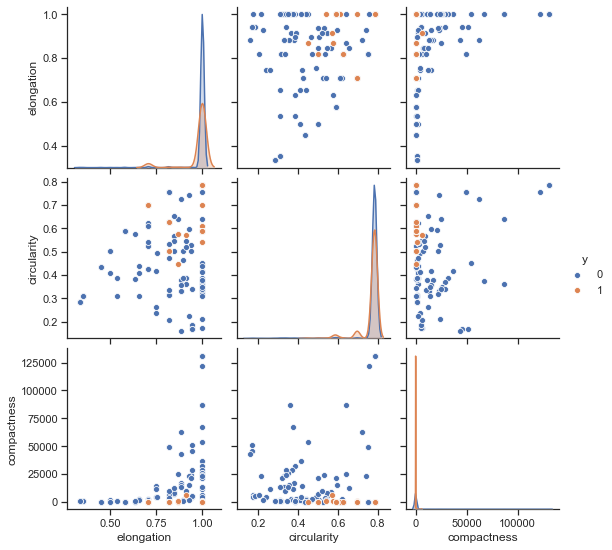

In [6]:
sn.set(style="ticks", color_codes=True)
shapefactor_df = pd.DataFrame(X_factors, columns=['elongation', 'circularity', 'compactness'])
shapefactor_df['y'] = Y_train
sn.pairplot(shapefactor_df, hue="y")

In [7]:
len(Y_val)

496

In [8]:
len(Y_test)

1219

In [9]:
train_val = TrainValTestModel(X_train, X_val, X_test, Y_train, Y_val, Y_test, 'RF', cross_val=True)

Fitting 4 folds for each of 100 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 31.2min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed: 34.2min finished


In [10]:
train_val.best_params

{'n_estimators': 200,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 90,
 'bootstrap': False}

In [11]:
train_val.fpr

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.01505376, 0.01505376, 0.04086022, 0.04086022,
       0.11612903, 0.12043011, 0.12903226, 0.13333333, 0.15483871,
       0.16129032, 0.1655914 , 0.17204301, 0.17634409, 0.18064516,
       0.18494624, 0.18709677, 0.19354839, 0.20430108, 0.20860215,
       0.2172043 , 0.22365591, 0.23010753, 0.2344086 , 0.23870968,
       0.24301075, 0.2516129 , 0.26021505, 0.26666667, 0.27096774,
       0.27526882, 0.29247312, 0.31397849, 0.31827957, 0.32903226,
       0.33763441, 0.34193548, 0.34623656, 0.35483871, 0.38064516,
       0.38709677, 0.39139785, 0.39784946, 0.4       , 0.4344086 ,
       0.43655914, 0.44516129, 0.46666667, 0.47526882, 0.47741935,
       0.55483871, 0.57204301, 0.58709677, 1.        ])

In [12]:
train_val.tpr

array([0.        , 0.03225806, 0.09677419, 0.48387097, 0.5483871 ,
       0.87096774, 0.87096774, 0.96774194, 0.96774194, 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        ])

In [13]:
train_val.thrshd_roc

array([2.00000000e+00, 1.00000000e+00, 9.97500000e-01, 8.99583333e-01,
       8.88333333e-01, 4.92083333e-01, 4.23750000e-01, 4.05000000e-01,
       2.05000000e-01, 1.95000000e-01, 4.25000000e-02, 4.16666667e-02,
       3.79166667e-02, 3.75000000e-02, 2.87500000e-02, 2.75000000e-02,
       2.66666667e-02, 2.54166667e-02, 2.50000000e-02, 2.41666667e-02,
       2.37500000e-02, 2.37500000e-02, 2.33333333e-02, 2.08333333e-02,
       2.04166667e-02, 2.00000000e-02, 1.87500000e-02, 1.83333333e-02,
       1.75000000e-02, 1.58333333e-02, 1.54166667e-02, 1.50000000e-02,
       1.41666667e-02, 1.41666667e-02, 1.37500000e-02, 1.29166667e-02,
       1.16666667e-02, 1.08333333e-02, 1.04166667e-02, 1.00000000e-02,
       9.16666667e-03, 8.75000000e-03, 8.33333333e-03, 7.91666667e-03,
       7.50000000e-03, 6.66666667e-03, 6.25000000e-03, 5.83333333e-03,
       5.41666667e-03, 5.00000000e-03, 4.58333333e-03, 4.16666667e-03,
       3.75000000e-03, 3.33333333e-03, 2.91666667e-03, 2.50000000e-03,
      

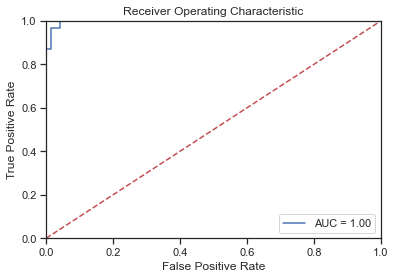

In [15]:
visual = Visualize()
visual.plot_roc_curve(train_val.fpr, train_val.tpr)

In [19]:
bst_threshold = 4.92083333e-01

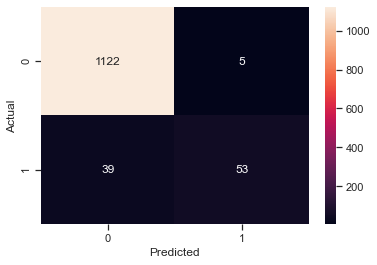

In [20]:
figure = visual.plot_confusion(train_val.clf, train_val.X_test, train_val.y_test, bst_threshold)

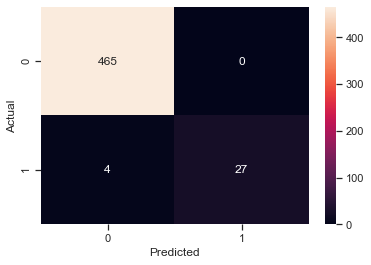

In [21]:
figure = visual.plot_confusion(train_val.clf, train_val.X_val, train_val.y_val, bst_threshold)

In [22]:
train_val.get_metrics(thresh=bst_threshold)

RF:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1127
           1       0.91      0.58      0.71        92

    accuracy                           0.96      1219
   macro avg       0.94      0.79      0.84      1219
weighted avg       0.96      0.96      0.96      1219




In [21]:
false_positive_list = train_val.false_positive_index(train_val.clf, train_val.X_val, train_val.y_val, bst_threshold)

In [27]:
false_positive_list

array([ 74,  87, 154, 173, 194, 207, 224, 270, 313, 328])

In [22]:
def drawreticule(x, y, c='w', alpha=0.5, angle=False):
    """
    draw lines around candidate data
    """
    if angle:
        plt.plot([x-70,x-10],[y-70,y-10],c,alpha=alpha)
        plt.plot([x+70,x+10],[y+70,y+10],c,alpha=alpha)
        plt.plot([x-70,x-10],[y+70,y+10],c,alpha=alpha)
        plt.plot([x+70,x+10],[y-70,y-10],c,alpha=alpha)
    else:
        plt.hlines(y,x-70,x-10,c,alpha=alpha)
        plt.hlines(y,x+10,x+70,c,alpha=alpha)
        plt.vlines(x,y-70,y-10,c,alpha=alpha)
        plt.vlines(x,y+10,y+70,c,alpha=alpha)

In [52]:
def mark_test_result(candidates, path, index_list):
    plt.figure(figsize=[25, 10])
    i = 0
    for index in index_list[:8]:
        i += 1
        plt.subplot(2, 4, i)
        fn = path + candidates['Name'][index]
        x = candidates['x'][index]
        y = candidates['y'][index]
        data = pickle.load(open(fn,'rb'))
        img = data[1]
        plt.imshow(img, vmin=0, vmax=255)
        plt.title('false dot: x=%d, y=%d'%(x, y))
        plt.clim([0,10])
        drawreticule(x, y)
plt.show()

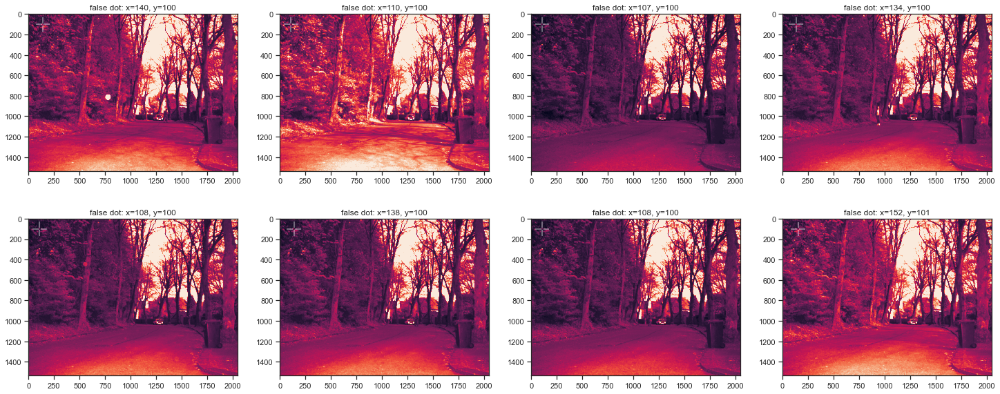

In [53]:
image_path = 'C:/dissertation/dataset/photos_April13/photo_object*'
label_path = 'C:/dissertation/dataset/labels_photos_April13.csv'
data_April13 = Data(image_path=image_path, label_path=label_path, version=1, del_num=8)
mark_test_result(candidates=candidates[-1], path='C:/dissertation/dataset/photos_April13/', index_list=false_positive_list)

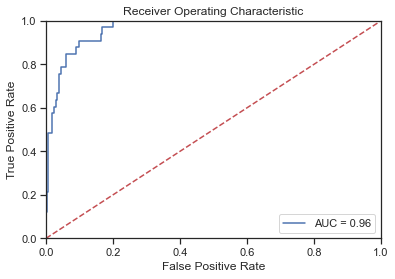

In [12]:
visual = Visualize()
visual.plot_roc_curve(train_val.fpr, train_val.tpr)

In [15]:
bst_threshold = 0.48484848

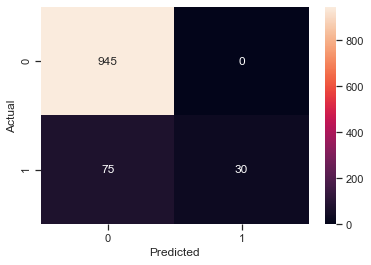

In [16]:
figure = visual.plot_confusion(train_val.clf, train_val.X_test, train_val.y_test, bst_threshold)

In [17]:
bst_threshold = 0.58774766

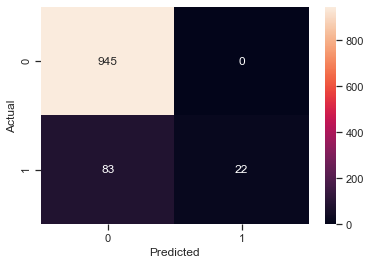

In [20]:
ax = visual.plot_confusion(train_val.clf, train_val.X_test, train_val.y_test, bst_threshold)

In [22]:
ax.figure.savefig('C:/dissertation/presentation/confusion_matrix.png', dpi=400)

In [13]:
image_path = 'C:/dissertation/dataset/photos20200608/photo_object*'
label_path = 'C:/dissertation/dataset/labels_photos_July08.csv'
data_july8 = Data(image_path=image_path, label_path=label_path, version=1, del_num=8)

In [14]:
false_positive_list = train_val.false_positive_index(train_val.clf, train_val.X_test, train_val.y_test, bst_threshold)
data_july8.mark_test_result(candidates=candidates_july8, path='C:/dissertation/dataset/photos20200608/', index_list=false_positive_list)

c:\dissertation\bumblebees-track\code\image.py:370: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=[25,20])


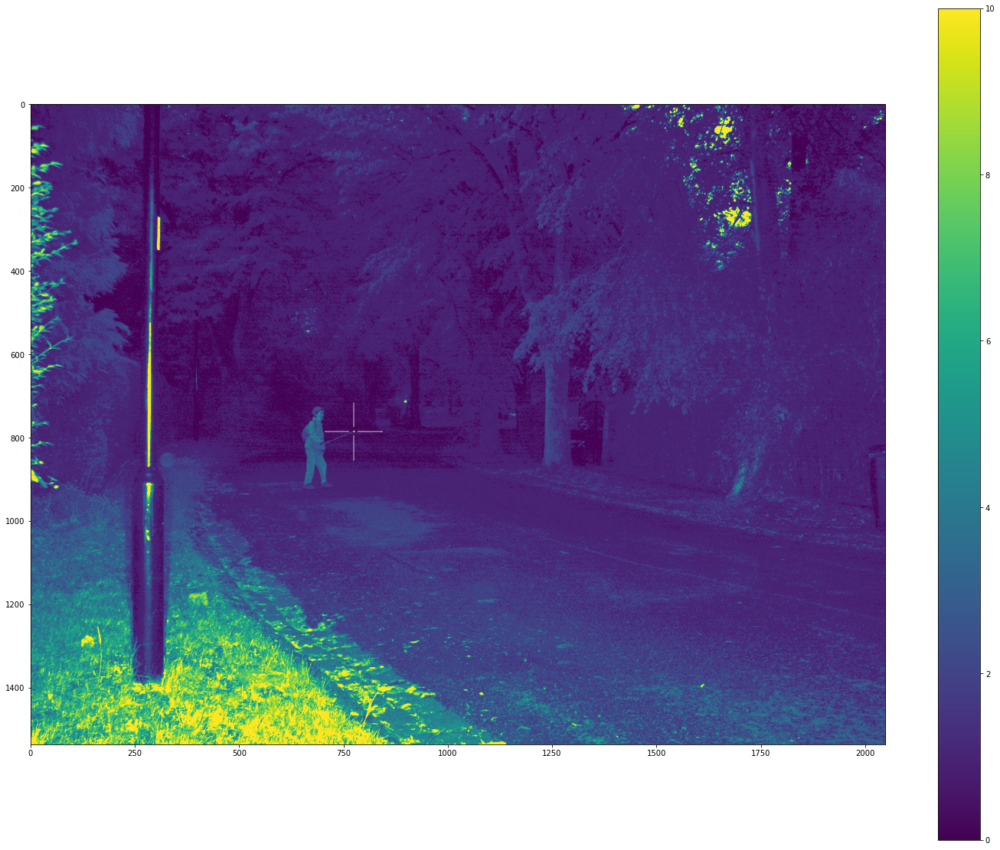

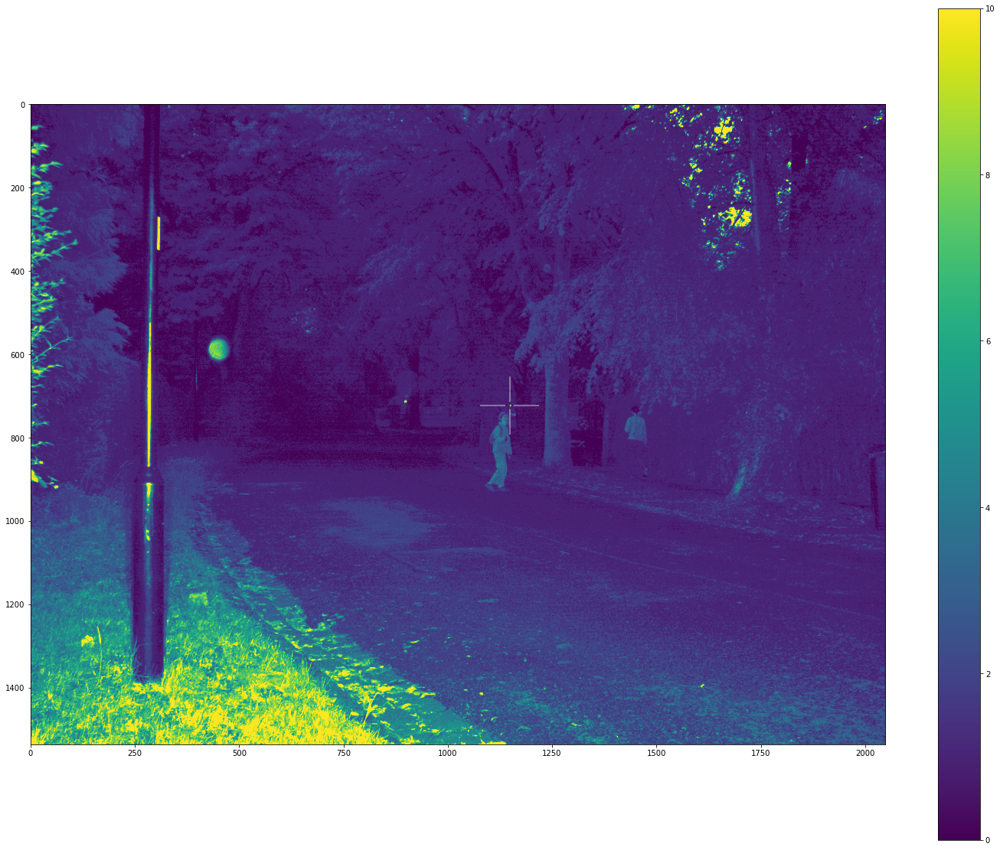

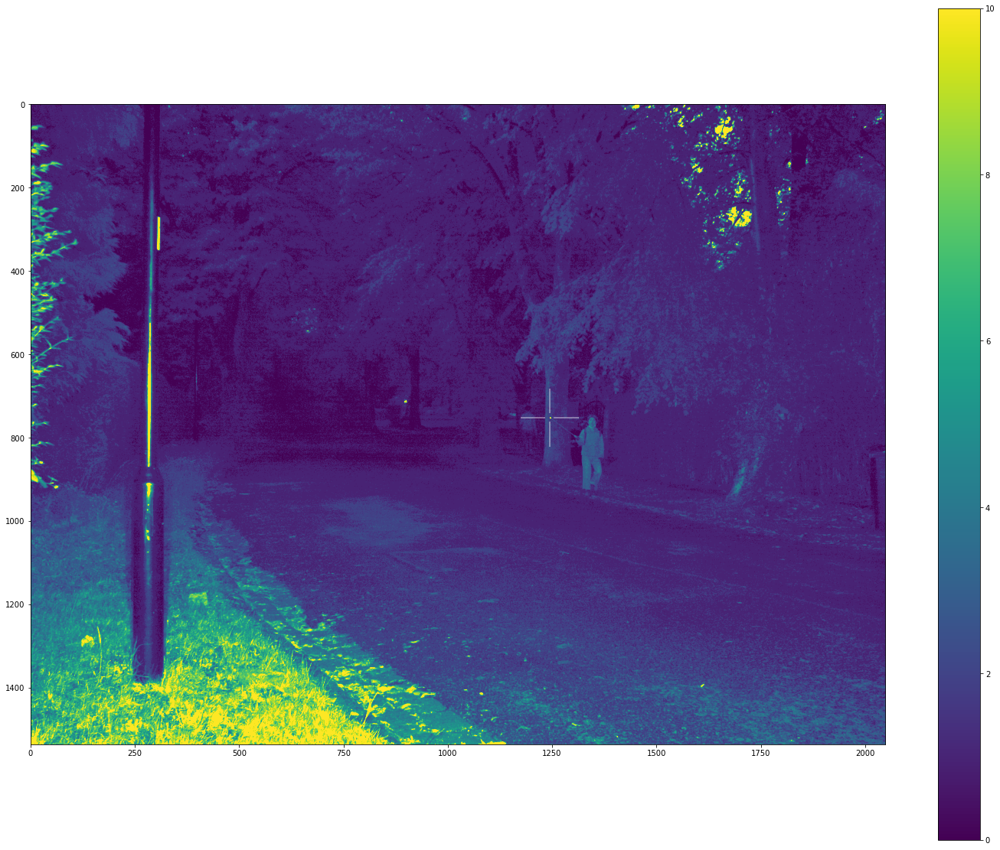

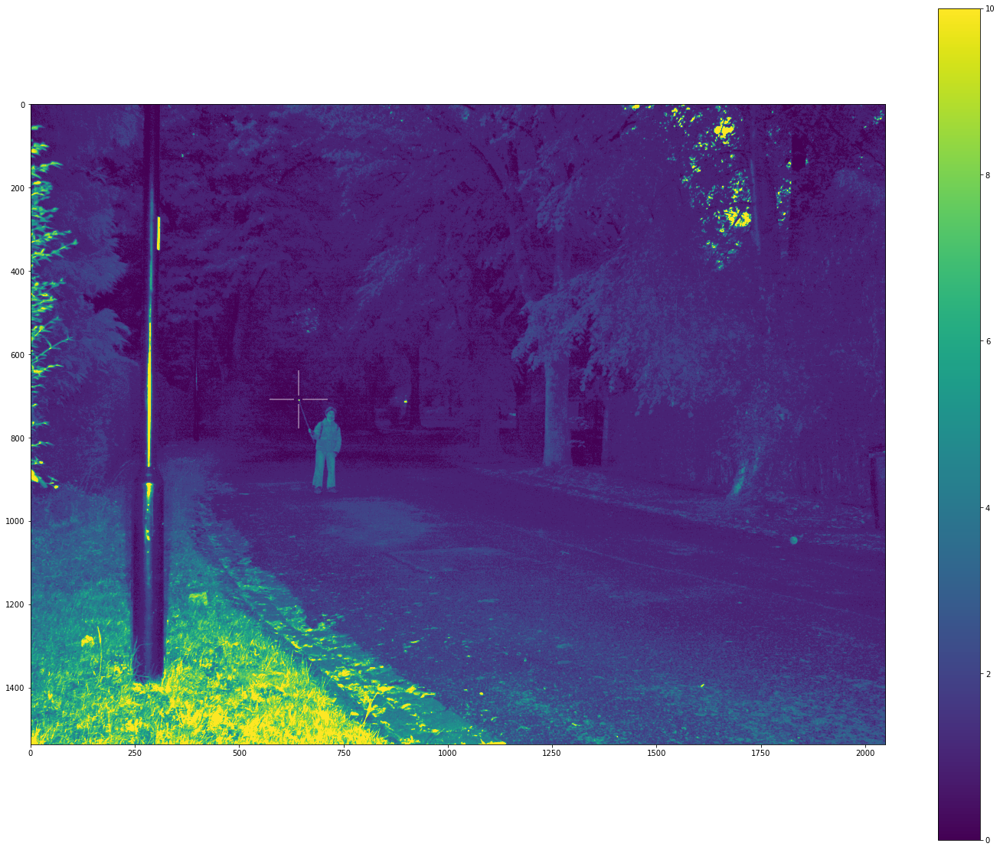

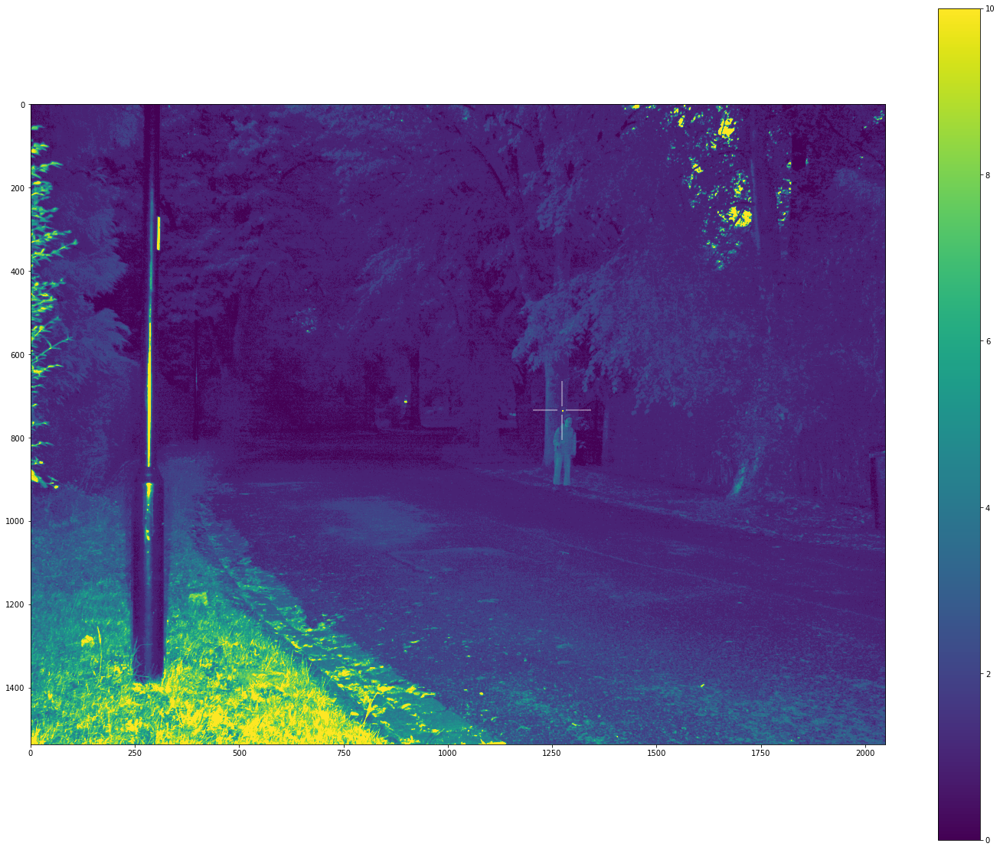

Error in callback <function flush_figures at 0x0000024BE0512820> (for post_execute):


KeyboardInterrupt: 

In [15]:
false_negative_list = train_val.false_negtive_index(train_val.clf, train_val.X_test, train_val.y_test, bst_threshold)
data_july8.mark_test_result(candidates=candidates_july8, path='C:/dissertation/dataset/photos20200608/', index_list=false_negative_list)

In [ ]:
train_val_RF = TrainValTestModel(X_train, X_val, X_test, Y_train, Y_val, Y_test, 'RF')
visual = Visualize()
visual.plot_roc_curve(train_val_RF.fpr, train_val_RF.tpr)

In [ ]:
train_val_RF.fpr

In [ ]:
train_val_RF.tpr

In [ ]:
train_val_RF.thrshd_roc

In [ ]:
bst_threshold = 0.18010407

In [ ]:
visual.plot_confusion(train_val_RF.clf, train_val_RF.X_test, train_val_RF.y_test, bst_threshold)

In [ ]:
false_positives_list = train_val_RF.false_positive_index(train_val_RF.clf, train_val_RF.X_test, train_val_RF.y_test, bst_threshold)

In [ ]:
data_july8.mark_test_result(candidates=candidates_july8, path='C:/dissertation/dataset/photos20200608/', index_list=false_positives_list)

In [ ]:
image_path = 'C:/dissertation/dataset/photos_April4/photo_object*'
label_path = 'C:/dissertation/dataset/labels_photos_April04.csv'
candidates_april4 = Data(image_path=image_path, label_path=label_path, version=0, del_num=6).generate_candidates(topn=20, boxsize=4, threshold=80)

image_path = 'C:/dissertation/dataset/photos_April5/photo_object*'
label_path = 'C:/dissertation/dataset/labels_photos_April05.csv'
candidates_april5 = Data(image_path=image_path, label_path=label_path, version=0, del_num=0).generate_candidates(topn=20, boxsize=4, threshold=80)

image_path = 'C:/dissertation/dataset/photos_April7/photo_object*'
label_path = 'C:/dissertation/dataset/labels_photos_April07.csv'
candidates_april7 = Data(image_path=image_path, label_path=label_path, version=0, del_num=0).generate_candidates(topn=20, boxsize=4, threshold=80)

image_path = 'C:/dissertation/dataset/photos_April13/photo_object*'
label_path = 'C:/dissertation/dataset/labels_photos_April13.csv'
candidates_april13 = Data(image_path=image_path, label_path=label_path, version=0, del_num=6).generate_candidates(topn=20, boxsize=4, threshold=80)

image_path = 'C:/dissertation/dataset/photos20200608/photo_object*'
label_path = 'C:/dissertation/dataset/labels_photos_July08.csv'
candidates_july8 = Data(image_path=image_path, label_path=label_path, version=1, del_num=8).generate_candidates(topn=20, boxsize=4, threshold=80)

In [ ]:
X_train = np.concatenate((candidates_april4['features'], candidates_april5['features'], candidates_april7['features'], candidates_april13['features']), axis=0)
X_test = candidates_july8['features']
Y_train = np.concatenate((candidates_april4['labels'], candidates_april5['labels'], candidates_april7['labels'], candidates_april13['labels']), axis=0)
Y_test = candidates_july8['labels']

In [ ]:
leave_one_cv = LeaveOneOutModel(X_train, X_test, Y_train, Y_test, 'GB')
visual = Visualize()
visual.plot_roc_curve(leave_one_cv.fpr, leave_one_cv.tpr)

In [ ]:
optimal_idx = np.argmax(leave_one_cv.tpr - leave_one_cv.fpr)
optimal_threshold = leave_one_cv.thrshd_roc[optimal_idx]
print(optimal_threshold)

In [ ]:
leave_one_cv.tpr

In [ ]:
leave_one_cv = LeaveOneOutModel(X_train, X_test, Y_train, Y_test, 'RF')
visual = Visualize()
visual.plot_roc_curve(leave_one_cv.fpr, leave_one_cv.tpr)

In [ ]:
optimal_idx = np.argmax(leave_one_cv.tpr - leave_one_cv.fpr)
optimal_threshold = leave_one_cv.thrshd_roc[optimal_idx]
print(optimal_threshold)

In [ ]:
leave_one_cv.tpr

In [ ]:
bst_threshold=0.28424753129751146
visual.plot_confusion(leave_one_cv.clf, leave_one_cv.X_train, leave_one_cv.Y_train, 0.6)

In [ ]:
visual.plot_confusion(leave_one_cv.clf, leave_one_cv.X_test, leave_one_cv.Y_test, 0.5)

In [ ]:
X_factor = np.concatenate((candidates_april4['factors'], candidates_april5['factors'], candidates_april7['factors'], candidates_april13['factors'], candidates_july8['factors']), axis=0)

In [ ]:
sn.set(style="ticks", color_codes=True)
shapefactor_df = pd.DataFrame(X_factor, columns=['elongation', 'circularity', 'compactness'])
shapefactor_df['y'] = np.concatenate((Y_train, Y_test), axis=0)
sn.pairplot(shapefactor_df, hue="y")

In [ ]:
false_positives_list = leave_one_cv.false_positive_index(leave_one_cv.clf, leave_one_cv.X_test, leave_one_cv.Y_test, bst_threshold)

In [ ]:
image_path = 'C:/dissertation/dataset/photos20200608/photo_object*'
label_path = 'C:/dissertation/dataset/labels_photos_July08.csv'
data_july8 = Data(image_path=image_path, label_path=label_path, version=1, del_num=8)
data_july8.mark_test_result(candidates=candidates_july8, path='C:/dissertation/dataset/photos20200608/', index_list=false_positives_list)

# save the model

In [23]:
from joblib import dump, load
dump(train_val.clf, 'RandomForestTrack.joblib') 
dump(train_val.scaler, 'NormalScaler.joblib')
dump(bst_threshold, 'BestThreshold.joblib') 

['BestThreshold.joblib']

In [ ]:
from joblib import dump, load
clf = load('C:/dissertation/bumblebees-track/code/RandomForestTrack.joblib') 
threshold = load('C:/dissertation/bumblebees-track/code/BestThreshold.joblib') 

In [ ]:
threshold

In [ ]:
# X_test and Y_test need to be normalized
visual = Visualize()
visual.plot_confusion(clf, X_test, Y_test, threshold)

In [ ]:
threshold

# reshape important features

In [24]:
importance = train_val.get_important_feature()
importance_pos = importance.argsort()[::-1]

In [25]:
max_value = np.max(importance)
min_value = np.min(importance)

######################################################
plot feature importance on image no_flash2
the importance of patch


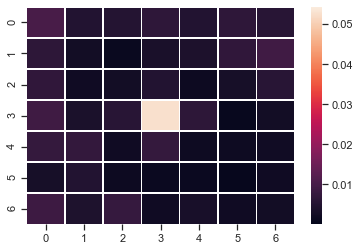

the importance of mean of patch is 0.001698
the importance of std of patch is 0.011028
the importance of edge detection of patch


ValueError: cannot reshape array of size 7 into shape (7,7)

In [26]:
visual.plot_image_by_feature_importance(importance, min_value, max_value)

In [35]:
def plot_image_by_feature_importance(importance, min_value, max_value, m=2, boxsize=3):
    image_type = ['past_dilate_img', 'future_dilate_img']
    img_size = (boxsize*2+1)**2
    for i in range(m):
        print('######################################################')
        print("plot feature importance on image", image_type[i])
        print('the importance of patch')
        feature_cut = importance[i*img_size:(i+1)*img_size].reshape(((boxsize*2+1), (boxsize*2+1)))
        ax = sn.heatmap(feature_cut, linewidth=0.5, vmin=min_value, vmax=max_value)
        plt.title("patch")
        plt.show()
        feature_cut_mean = importance[m*img_size+i]
        print('the importance of mean of patch is %f' % feature_cut_mean)
        feature_cut_std = importance[m*img_size+m+i]
        print('the importance of std of patch is %f' % feature_cut_std)
        print('the importance of edge detection of patch')
        feature_edge = importance[(m*img_size+2*m+i*img_size):(m*img_size+2*m+(i+1)*img_size)].reshape(((boxsize*2+1), (boxsize*2+1)))
        ax = sn.heatmap(feature_edge, linewidth=0.5, vmin=min_value, vmax=max_value)
        plt.title("edge detection")
        plt.show()
        feature_edge_mean = importance[m*img_size*2+2*m+i]
        print('the importance of mean of edge detection of patch is %f' % feature_edge_mean)
        feature_edge_std = importance[m*img_size*2+2*m+m+i]
        print('the importance of std of edge detection of patch is %f' % feature_edge_std)
        feature_ring_mean = importance[(m*img_size+2*m)*2+i]
        print('the importance of mean of ring patch is %f' % feature_ring_mean)
        feature_ring_std = importance[(m*img_size+2*m)*2+m+i]
        print('the importance of std of ring patch is %f' % feature_ring_std)
        elongation = importance[(m*img_size+2*m)*2+m+i+1]
        print('the importance of elongation is %f' % elongation)
        circularity = importance[(m*img_size+2*m)*2+m+i+2]
        print('the importance of circularity is %f' % circularity)
        compactness = importance[(m*img_size+2*m)*2+m+i+3]
        print('the importance of compactness is %f' % compactness)
        

######################################################
plot feature importance on image past_dilate_img
the importance of patch


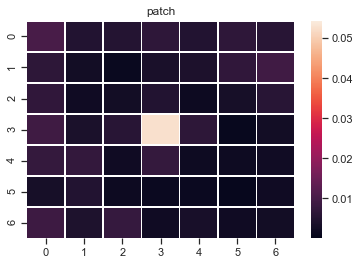

the importance of mean of patch is 0.009800
the importance of std of patch is 0.003890
the importance of edge detection of patch


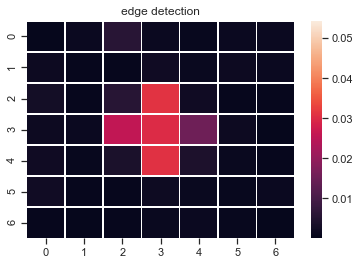

the importance of mean of edge detection of patch is 0.011028
the importance of std of edge detection of patch is 0.009623
the importance of mean of ring patch is 0.001231
the importance of std of ring patch is 0.003326
the importance of elongation is 0.004716
the importance of circularity is 0.000036
the importance of compactness is 0.000189
######################################################
plot feature importance on image future_dilate_img
the importance of patch


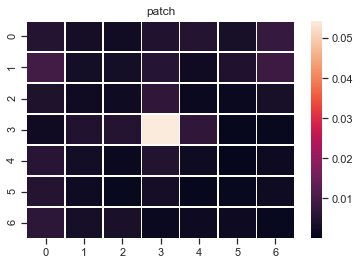

the importance of mean of patch is 0.009589
the importance of std of patch is 0.004630
the importance of edge detection of patch


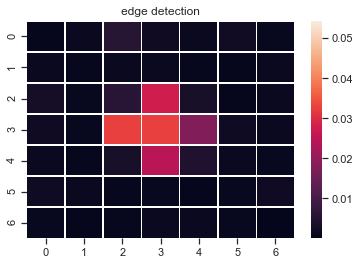

the importance of mean of edge detection of patch is 0.010238
the importance of std of edge detection of patch is 0.012193
the importance of mean of ring patch is 0.001597
the importance of std of ring patch is 0.004716
the importance of elongation is 0.000036
the importance of circularity is 0.000189
the importance of compactness is 0.000409


In [36]:
plot_image_by_feature_importance(importance, min_value, max_value)